In [1]:
import torch
import torch.nn as nn

device = torch.device('cuda:0')  # используй первую GPU (номеруются с нуля)

tensor([[-0.0179,  0.0931,  0.0127, -0.2338, -0.2009, -0.3245, -0.2304, -0.1470],
        [ 0.1603,  0.4848,  0.1112, -0.2529, -0.3787, -0.2782,  0.1682, -0.1547],
        [-0.2261,  0.0726,  0.1356,  0.0133,  0.4808,  0.0528, -0.1443, -0.0139],
        [-0.0941, -0.0938,  0.2644, -0.0818, -0.4007,  0.2548, -0.0316, -0.1476],
        [ 0.0702,  0.0075, -0.0150, -0.4790, -0.0189,  0.2140, -0.1774,  0.2351]],
       device='cuda:0', grad_fn=<AddmmBackward>)

# Колоризация изображений

Начнём практическую часть. Обучим autoencoder-like сеть, которая учится восстанавливать изображение по его черно-белой версии. В качестве лосса будем так же использовать какую-нибудь меру расстояния между изображениями (например, l1 или l2).

Тот пайплайн, что у нас получится, с минимальными изменениями можно будет также использовать и для других подобных задач, связанных с восстановлением изображений после каких-либо необратимых преобразований, например после подмешивании шума (denoising autoencoder) или понижения размера (DeepHD).

![](https://camo.githubusercontent.com/c5f95c94d70a3e52561c1d0591e84a5e3b86eb74/687474703a2f2f726963687a68616e672e6769746875622e696f2f636f6c6f72697a6174696f6e2f7265736f75726365732f696d616765732f6e65745f6469616772616d2e6a7067)

In [2]:
import torch
import torch.nn as nn

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

Для начала скачаем данные. Годятся вообще любые изображения, не обязательно из какого-то изветсного датасета. Этой командой можно скачать и распакавать фотографии с одной школы по программированию, проходившей этим летом.

In [3]:
!wget http://sereja.me/f/universum_compressed.tar
!tar xf universum_compressed.tar

--2021-10-29 07:55:50--  http://sereja.me/f/universum_compressed.tar
Resolving sereja.me (sereja.me)... 213.159.215.132
Connecting to sereja.me (sereja.me)|213.159.215.132|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 72028160 (69M) [application/x-tar]
Saving to: ‘universum_compressed.tar’

universum_compresse 100%[===================>]  68.69M  6.40MB/s    in 17s     

2021-10-29 07:56:08 (3.97 MB/s) - ‘universum_compressed.tar’ saved [72028160/72028160]



In [4]:
from tqdm.notebook import tqdm
from time import sleep


  0%|          | 0/10 [00:00<?, ?it/s]

In [5]:
import os
from PIL import Image

class ColorizationDataset(Dataset):
    def __init__(self, path, transform_x, transform_y):
        self.transform_x = transform_x
        self.transform_y = transform_y
      
        filenames = []
        for root, dirs, files in os.walk(path):
            for file in files:
                if file.endswith('.jpg') or file.endswith('.JPG'):
                    filenames.append(os.path.join(root, file))

        self.images = []
        for filename in tqdm(filenames):
            try:
                with Image.open(filename) as image:
                    self.images.append(image.copy())
            except:
                pass
                #print('Could not load image:', filename)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = self.images[idx]
        Y = self.transform_y(img)
        X = self.transform_x(Y)
        return X, Y

Чтобы подавать картинки на вход нейросети, нужно их перевести в тензоры, причём одинакового размера.

In [6]:
transform_all = transforms.Compose([
    # вырежем случайный квадратик
    transforms.RandomResizedCrop(128),
    # горизонтально перевернем -- изображение останется валидным
    transforms.RandomHorizontalFlip(),
    # что бы ещё поделать, чтобы увеличить размер датасета?
    transforms.ColorJitter(),
    transforms.ToTensor(),
])

def to_grayscale(x):
    return 1 - (x[0] * 0.299 + x[1] * 0.587 + x[2] * 0.114).view(1, 128, 128)
    # минутка эволюционной биологии: как вы думаете, почему коэффициенты именно такие?

In [7]:
dataset = ColorizationDataset('universum-photos', to_grayscale, transform_all)
loader = DataLoader(dataset, batch_size=64, shuffle=True)

  0%|          | 0/1254 [00:00<?, ?it/s]

**Skip-connection**. Иногда бывает полезно присоединить к выходу какого-то слоя его вход, чтобы следующий получил такую же, неизменённую копию. Здесь мы поступим именно так: подадим исходное черно-белое изображение в какую-то одну часть сети, которая сконцентрируется на определении цвета, а затем припишем последним слоем её выход и отправим дальше другому модулю, который уже раскрасит это исходное изображение. От простоты `nn.Sequential`, правда, уже придётся отказаться, и нужно написать свой класс.

In [18]:
class Colorizer(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.preconcat = nn.Sequential(
            nn.Conv2d(1, 32, (3, 3), padding=1),                                 
            nn.MaxPool2d((2, 2), stride=(2, 2)), 
            nn.LeakyReLU(),
            nn.BatchNorm2d(32),
            nn.Conv2d(32, 64, (3, 3), padding=1),                                
            nn.MaxPool2d((2, 2), stride=(2, 2)), 
            nn.LeakyReLU(),
            nn.BatchNorm2d(64),
            nn.Dropout(),
            nn.Conv2d(64, 256, (3, 3), padding=1),                               
            nn.MaxPool2d((2, 2), stride=(2, 2)),
            nn.LeakyReLU(),
            nn.BatchNorm2d(256),
            nn.Dropout(),
            
            nn.Upsample(scale_factor=2),        
            nn.Conv2d(256, 128, (3, 3), padding=1),
            nn.LeakyReLU(),
            nn.Upsample(scale_factor=2),
            nn.BatchNorm2d(128),
            nn.Dropout(),
            nn.Conv2d(128, 64, (3, 3), padding=1), 
            nn.LeakyReLU(),
            nn.Upsample(scale_factor=2),
            nn.BatchNorm2d(64),
            nn.Dropout(),
            nn.Conv2d(64, 64, (3, 3), padding=1),
            nn.LeakyReLU(),
            nn.BatchNorm2d(64),
        )
         
        self.postconcat = nn.Sequential(         
            nn.Conv2d(65, 32, (3, 3), padding=1),
            nn.LeakyReLU(),
            nn.BatchNorm2d(32),
            nn.Conv2d(32, 3, (3, 3), padding=1),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        h = self.preconcat(x)
        # исходное чб изображение -- просто дополнительным слоем
        h = torch.cat((h, x), 1)
        h = self.postconcat(h)
        return h

In [ ]:
def to_numpy_image(img):
    # tl;dr: PyTorch хочет (3, 128, 128), а plt.imshow хочет (128, 128, 3)
    # есть два популярных формата для цветных картинок:
    #  1. где размерность, соответствующая каналам, идёт последней
    #  2. где размерность, соответствующая каналам, идёт первой
    # при работе с нейросетями удобен первый подход -- так запрашиваемая
    # при вычислениях память идёт последовательно, и из-за кэширования
    # операции свёртки работают быстрее
    # второй подход удобнее при уже работе с устройством, которое эти картинки показывает
    # -- удобно на три лампочки послать сразу три последовательно идущих байта
    return img.detach().cpu().view(3, 128, 128).transpose(0, 1).transpose(1, 2).numpy()

In [9]:
def show_image(epoch):
    img_gray, img_true = dataset[epoch]
    img_pred = model(img_gray.to(device).view(1, 1, 128, 128))
    img_pred = to_numpy_image(img_pred)
    plt.figure(figsize=(10,10))
    
    plt.subplot(141)
    plt.axis('off')
    plt.set_cmap('Greys')
    plt.imshow(img_gray.reshape((128, 128)))

    plt.subplot(142)
    plt.axis('off')
    plt.imshow(img_pred.reshape((128, 128, 3)))

    plt.subplot(143)
    plt.axis('off')
    plt.imshow(to_numpy_image(img_true))
    
    plt.show()

Дальше как обычно:

In [21]:
num_epochs = 100
lr = 1e-4

model = Colorizer().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=20, gamma=0.1)
criterion = nn.L1Loss() 

  0%|          | 0/100 [00:00<?, ?it/s]

0 epoch: 0.0117701351409778


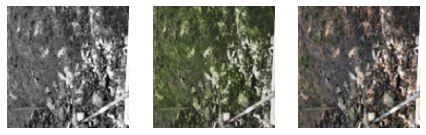

1 epoch: 0.011559275444597006


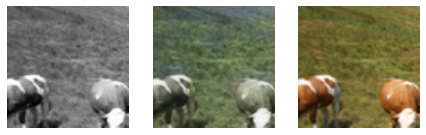

2 epoch: 0.011987291742116213


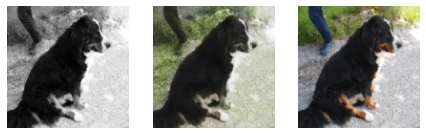

3 epoch: 0.011605458101257682


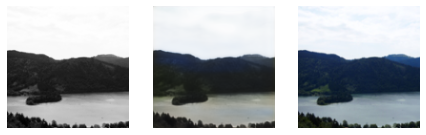

4 epoch: 0.01150902034714818


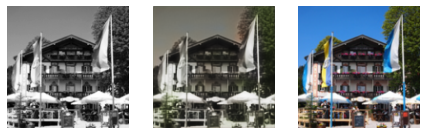

5 epoch: 0.011564943357370794


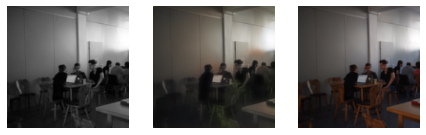

6 epoch: 0.011621720506809652


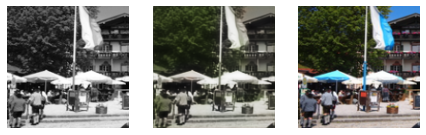

7 epoch: 0.011382443131878972


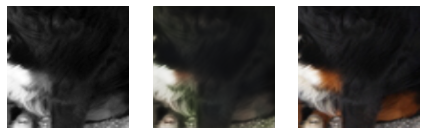

8 epoch: 0.011604171129874885


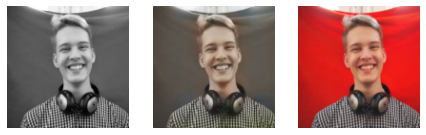

9 epoch: 0.011404953780584037


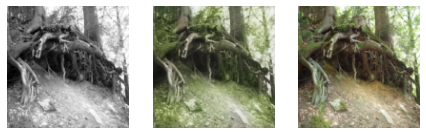

10 epoch: 0.011817752092611045


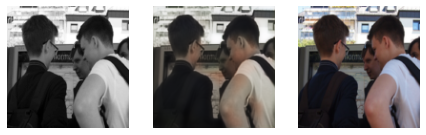

11 epoch: 0.011774002225138247


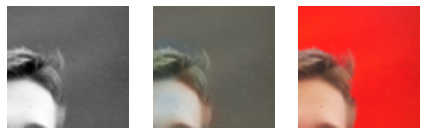

12 epoch: 0.011694598710164428


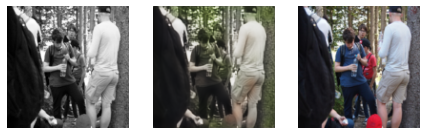

13 epoch: 0.01146133872680366


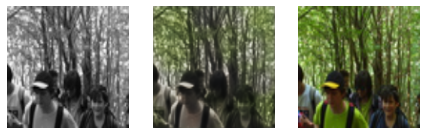

14 epoch: 0.011592903756536543


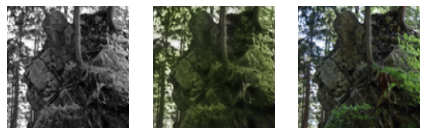

15 epoch: 0.011272552190348506


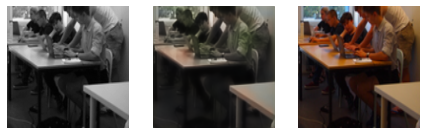

16 epoch: 0.011565028806217015


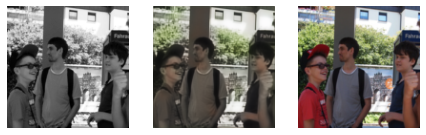

17 epoch: 0.011695502558723092


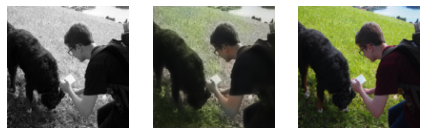

18 epoch: 0.011626185732893646


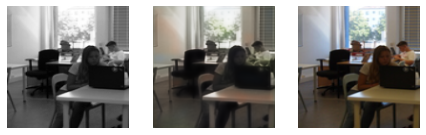

19 epoch: 0.011395424837246537


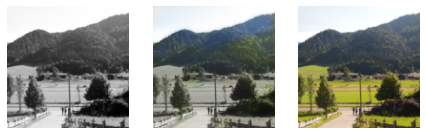

20 epoch: 0.011567785404622555


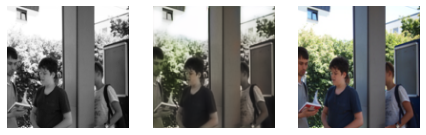

21 epoch: 0.011309854220598936


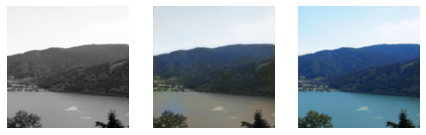

22 epoch: 0.011637238436378539


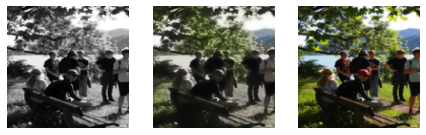

23 epoch: 0.0113571613910608


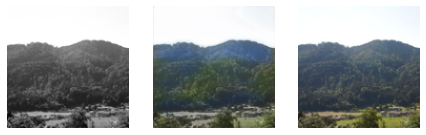

24 epoch: 0.01151485025184229


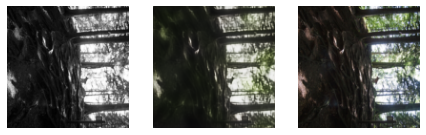

25 epoch: 0.011405560944695026


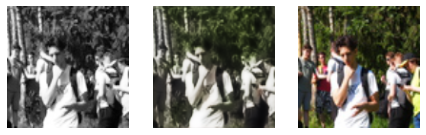

26 epoch: 0.01154608215438202


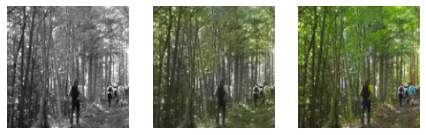

27 epoch: 0.011297103541437536


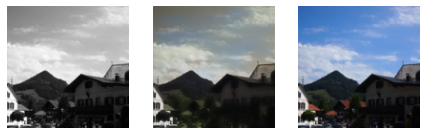

28 epoch: 0.011279363534413278


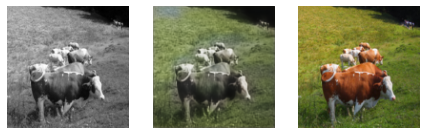

29 epoch: 0.01119049807311967


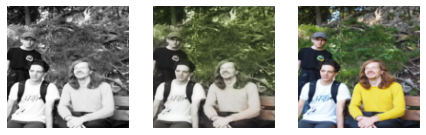

30 epoch: 0.011438152112532407


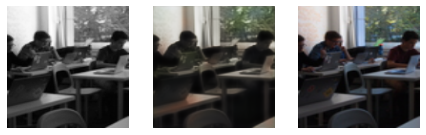

31 epoch: 0.011388801853172481


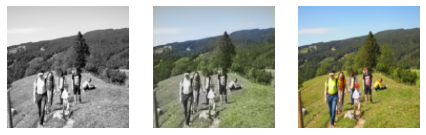

32 epoch: 0.011196193576324731


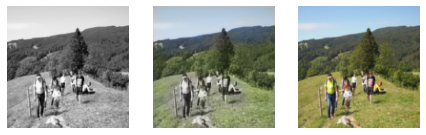

33 epoch: 0.011804679874330759


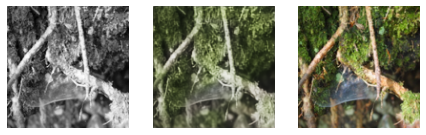

34 epoch: 0.011503296555019915


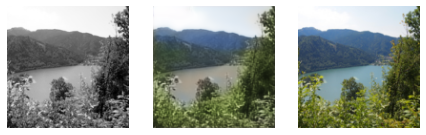

35 epoch: 0.011643352976534516


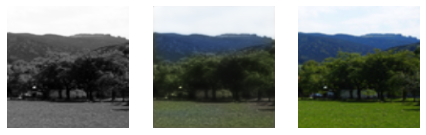

36 epoch: 0.011390031373593956


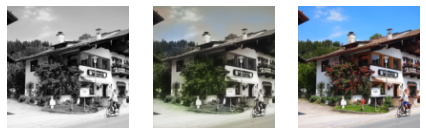

37 epoch: 0.011250756680965424


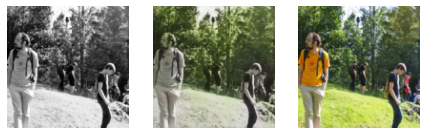

38 epoch: 0.011272250325419009


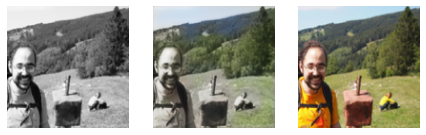

39 epoch: 0.011362509860191494


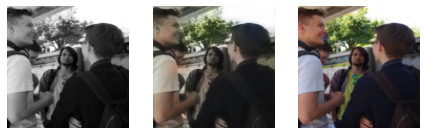

40 epoch: 0.01135150040499866


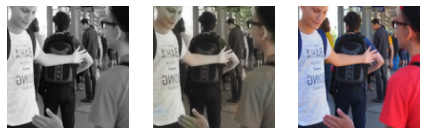

41 epoch: 0.011426498647779226


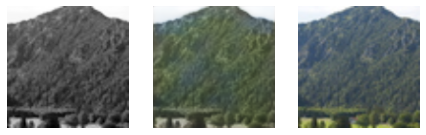

42 epoch: 0.011515656602568924


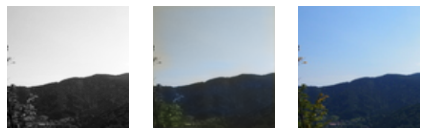

43 epoch: 0.011682312411721796


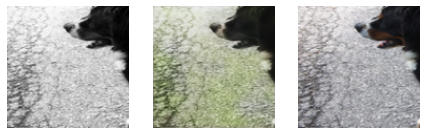

44 epoch: 0.011204304115381092


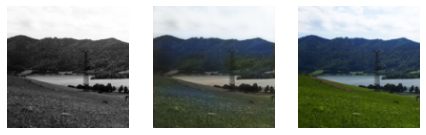

45 epoch: 0.011206638941075653


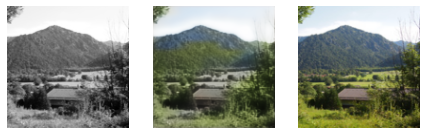

46 epoch: 0.011397184105589986


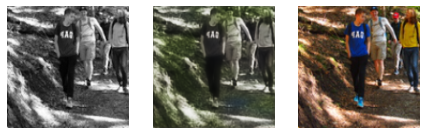

47 epoch: 0.011932806170079857


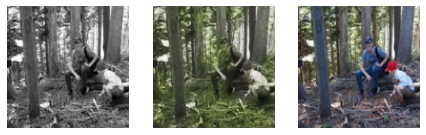

48 epoch: 0.011585808300878853


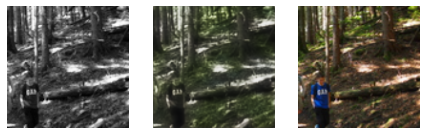

49 epoch: 0.011283408326562494


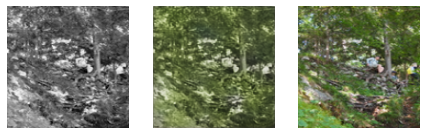

50 epoch: 0.0112967494642362


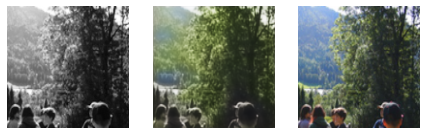

51 epoch: 0.011314360715914518


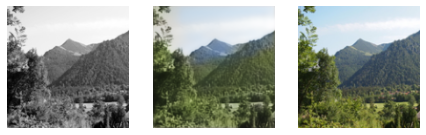

52 epoch: 0.011649380205199122


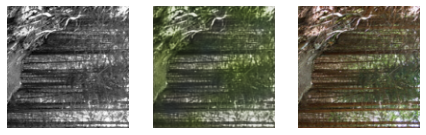

53 epoch: 0.011338664044160396


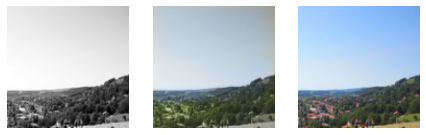

54 epoch: 0.011446812655776739


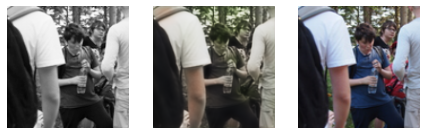

55 epoch: 0.01150726230116561


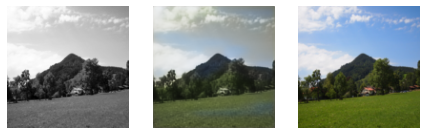

56 epoch: 0.011516728205606341


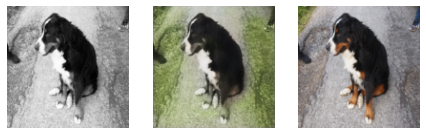

57 epoch: 0.011841225437819958


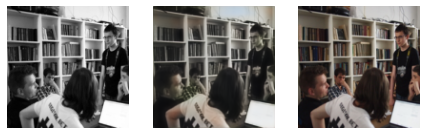

58 epoch: 0.011446189135313034


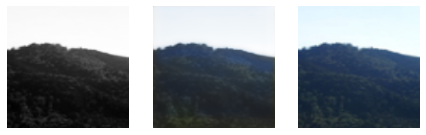

59 epoch: 0.011305085616186261


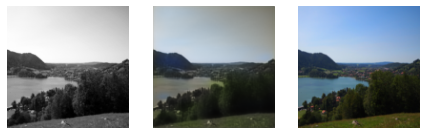

60 epoch: 0.011451956001110375


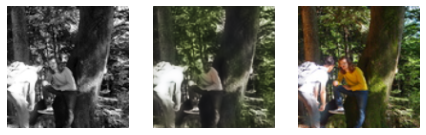

61 epoch: 0.011197840154636651


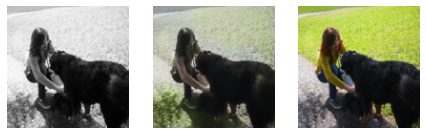

62 epoch: 0.011378161259926856


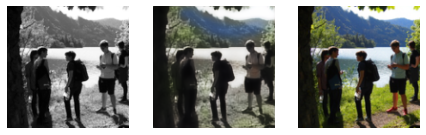

63 epoch: 0.011204047477804124


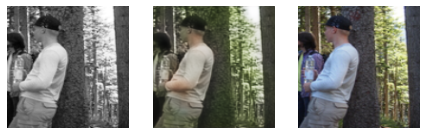

64 epoch: 0.011309901543427259


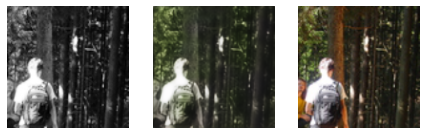

65 epoch: 0.011750902223866433


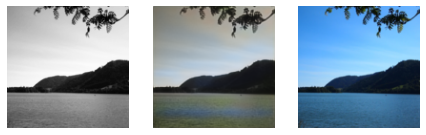

66 epoch: 0.011464650742709637


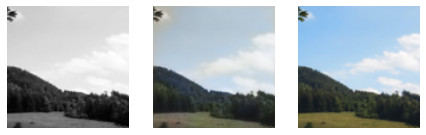

67 epoch: 0.011513032426591963


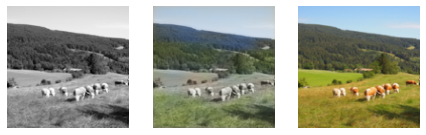

68 epoch: 0.011660961783491075


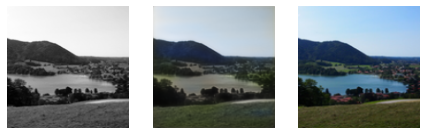

69 epoch: 0.011433914885856211


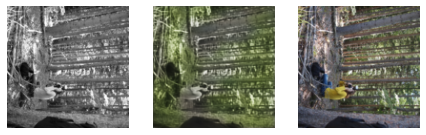

70 epoch: 0.011417608009651303


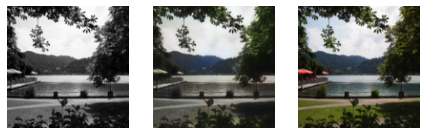

71 epoch: 0.011498020205181092


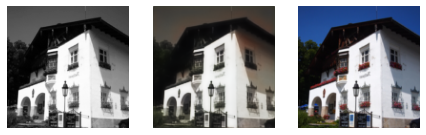

72 epoch: 0.011495043465401977


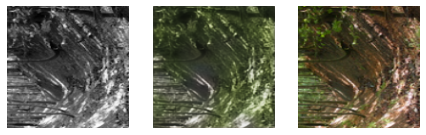

73 epoch: 0.01144070562440902


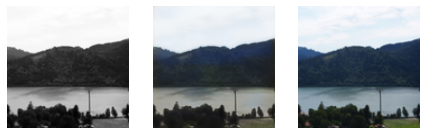

74 epoch: 0.011452262930106372


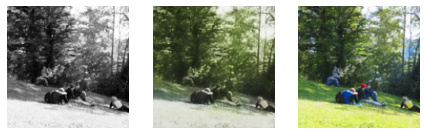

75 epoch: 0.011416412540711462


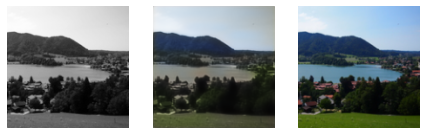

76 epoch: 0.011364995152689517


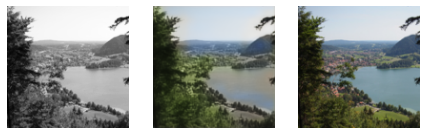

77 epoch: 0.01127757685026154


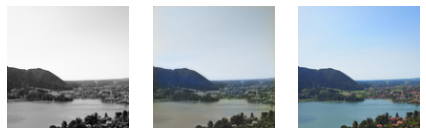

78 epoch: 0.011257765640038997


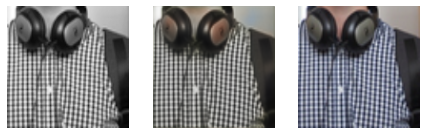

79 epoch: 0.011717823683284223


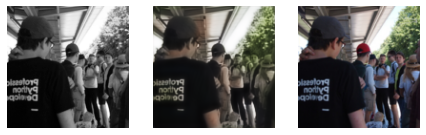

80 epoch: 0.011525843059644103


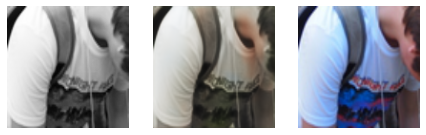

81 epoch: 0.011676691239699721


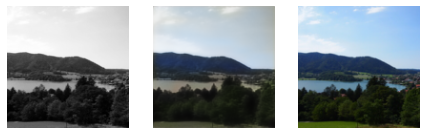

82 epoch: 0.011328810767736286


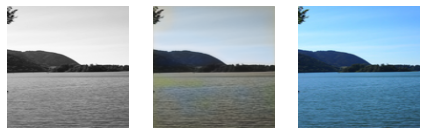

83 epoch: 0.011447592987678945


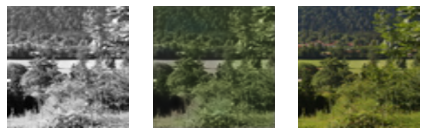

84 epoch: 0.011247176909819245


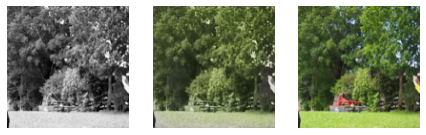

85 epoch: 0.01121237885672599


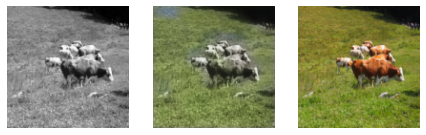

86 epoch: 0.011258052720222622


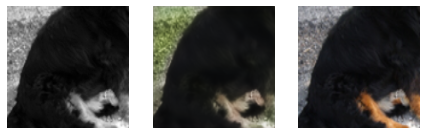

87 epoch: 0.011658444709610194


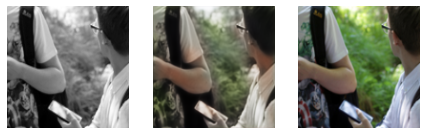

88 epoch: 0.011211290606297553


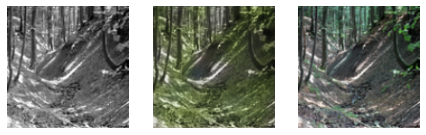

89 epoch: 0.011332078487612307


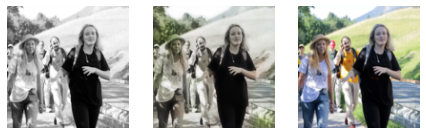

90 epoch: 0.01131256704684347


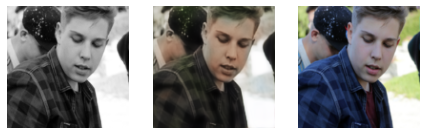

91 epoch: 0.011487871233839542


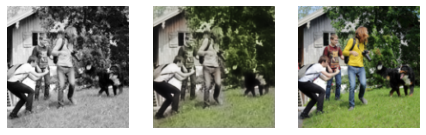

92 epoch: 0.011594304931350052


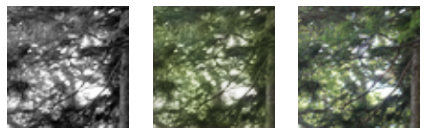

93 epoch: 0.011491512006614357


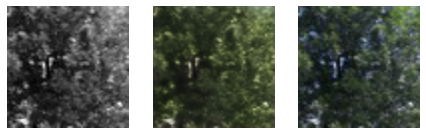

94 epoch: 0.011399222014006227


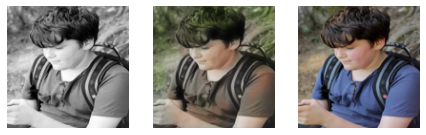

95 epoch: 0.011246525391470641


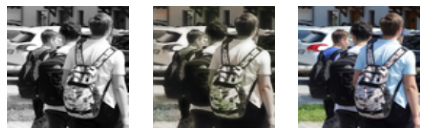

96 epoch: 0.0118680052109994


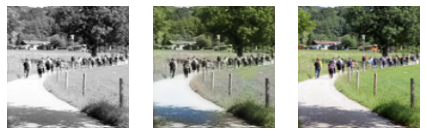

97 epoch: 0.011558113328646868


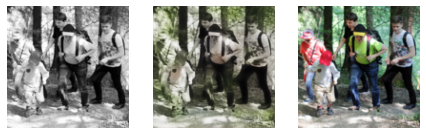

98 epoch: 0.011387547419872135


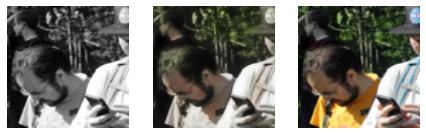

99 epoch: 0.011407629062887281


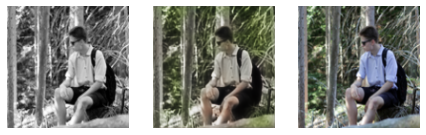

In [22]:
history = []
for epoch in tqdm(range(num_epochs)):
    ep_loss = 0
    model.train()
    for x, y in loader:
        
        x = x.to(device)
        y = y.to(device) 

        optimizer.zero_grad()
        output = model(x)
      
        loss = criterion(output, y)
        ep_loss += loss.item()
      
        history.append(loss.item())
      
        loss.backward()
       
        optimizer.step()
        del x
        del y 
        torch.cuda.empty_cache()

    scheduler.step()
    print(f'{epoch} epoch: {ep_loss/64}')
    model.eval()
    show_image(epoch)


In [26]:
torch.save(model, 'colorization_model_model')

In [27]:
model = torch.load('colorization_model_model')
model.eval()

Colorizer(
  (preconcat): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (2): LeakyReLU(negative_slope=0.01)
    (3): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (6): LeakyReLU(negative_slope=0.01)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): Dropout(p=0.5, inplace=False)
    (9): Conv2d(64, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (10): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (11): LeakyReLU(negative_slope=0.01)
    (12): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): Dropout(p=0.5, 

В подобных нечётко поставленных задачах важно смотреть не цифры, а на реальные примеры.


### Посмотрим на результат

1.На фото природы (где много зелени) сетка справляется неплохо, хотя конечно присутствует любовь к раскрашиванию все зеленым 

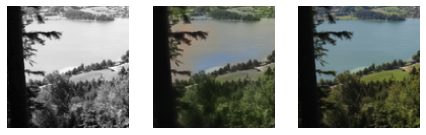

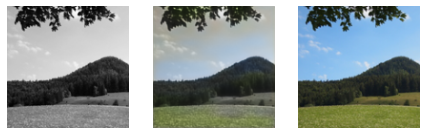

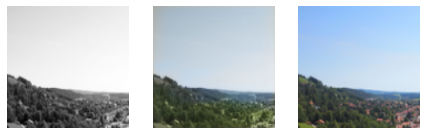

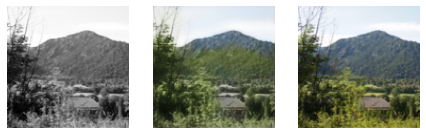

In [36]:
for i in [76, 66, 53, 51]:
  show_image(i)

2. С людьми работать тяжелее, она опять хочет покрасить волосы в болотный, но зато сеть старается раскрашивать лица в телесный цвет

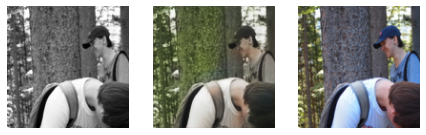

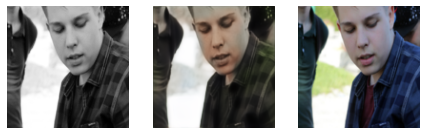

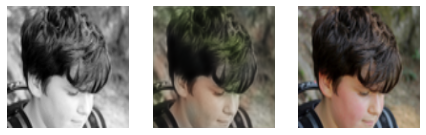

In [37]:
for i in [80, 90, 94]:
  show_image(i)